In [1]:
from cam_utils import all_layer_model_sample_activation

In [2]:
from cam_utils import visualize_cam_and_activation

In [3]:
from cam_utils import heatmap_image_process

In [4]:
from cam_utils import get_cam

In [5]:
from preprocess_data import preprocess_image

In [6]:
from creating_model import all_layer_model

In [7]:
import tensorflow as tf
import matplotlib.pyplot as plt
import tensorflow.keras.backend as K
from get_data import cat_dog_data
import numpy as np
splits, info = cat_dog_data()

(train, valid, test) = splits

num_examples = info.splits['train'].num_examples
num_classes = info.features['label'].num_classes

from preprocess_data import format_image
from configuration_file import BATCH_SIZE

train_dataset = train.shuffle(num_examples//4).map(format_image).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

valid_dataset = valid.map(format_image).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

test_dataset = test.map(format_image).batch(1)

In [8]:
model = tf.keras.models.load_model('trained_model.h5')

In [9]:
from get_data import getting_one_test_image

In [10]:
image, label = getting_one_test_image(test_dataset=test_dataset)

In [11]:
preprocessed_image = preprocess_image(image)
predicted_label = np.argmax(model.predict(preprocessed_image), axis=-1)[0]

In [12]:
heatmap = get_cam(model=model,
       preprocessed_image=preprocessed_image,
       label_of_image=label,
        layer_name='block5_conv3'
   )

binary loss [1.001353e-05]


In [13]:
heatmap, superimposed = heatmap_image_process(heatmap, image)

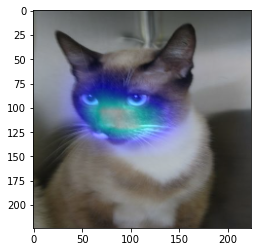

In [14]:
plt.imshow(superimposed)

In [15]:
all_layer_model = all_layer_model(model, last_conv_layer=18)

In [16]:
activations, sample_activation = all_layer_model_sample_activation(
                                        preprocessed_image=preprocessed_image,
                                        all_layer_model=all_layer_model,
                                        layer_no=0, filter_no=18)

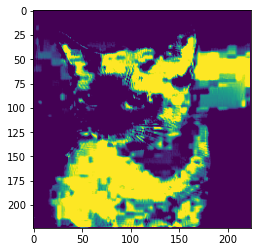

In [17]:
plt.imshow(sample_activation)

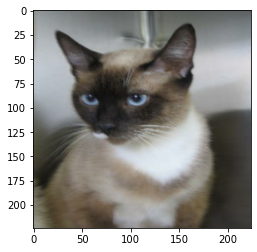

In [18]:
plt.imshow(image)

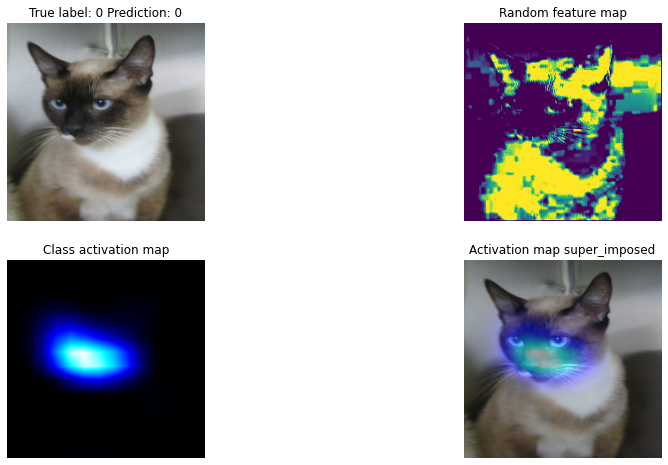

In [19]:
visualize_cam_and_activation(image,
                            label,
                            predicted_label,
                            heatmap,
                            superimposed,
                            sample_activation)

In [20]:
len(activations)

17

In [21]:
outputs = [layer.output for layer in model.layers[1:18]]
layer_names = []
for layer in outputs:
    print(layer.name.split('/')[0])
    layer_names.append(layer.name.split('/')[0])

block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_pool
block5_conv1
block5_conv2
block5_conv3


In [22]:
assert len(layer_names) == len(activations), "Make sure layers and activations has same length"

In [23]:
images_per_row = 16

In [24]:
from viz_utils import visualize_intermediate_activation

size = 224, no_columns = 4 images_per_row = 16
size = 224, no_columns = 4 images_per_row = 16
size = 112, no_columns = 4 images_per_row = 16
size = 112, no_columns = 8 images_per_row = 16
size = 112, no_columns = 8 images_per_row = 16
size = 56, no_columns = 8 images_per_row = 16
size = 56, no_columns = 16 images_per_row = 16
size = 56, no_columns = 16 images_per_row = 16
size = 56, no_columns = 16 images_per_row = 16
size = 28, no_columns = 16 images_per_row = 16
size = 28, no_columns = 32 images_per_row = 16
size = 28, no_columns = 32 images_per_row = 16
size = 28, no_columns = 32 images_per_row = 16
size = 14, no_columns = 32 images_per_row = 16
size = 14, no_columns = 32 images_per_row = 16
size = 14, no_columns = 32 images_per_row = 16
size = 14, no_columns = 32 images_per_row = 16


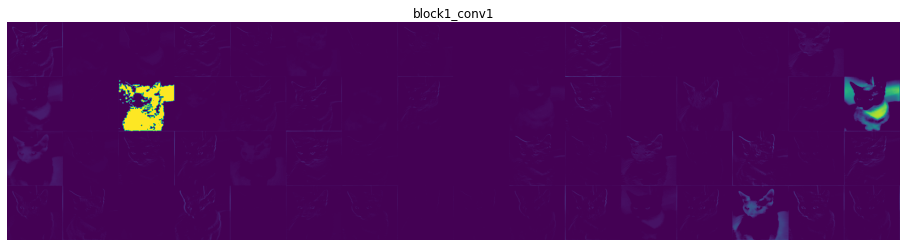

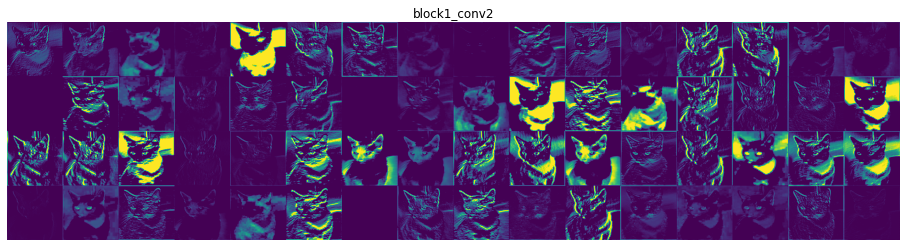

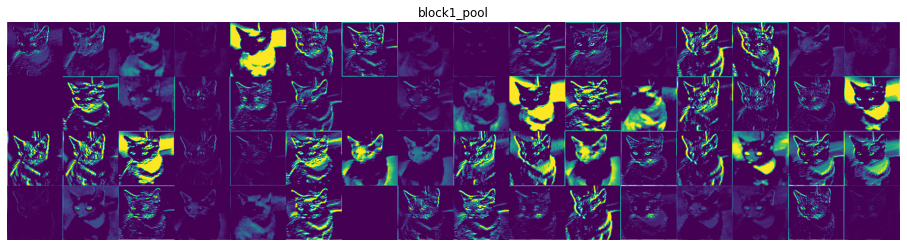

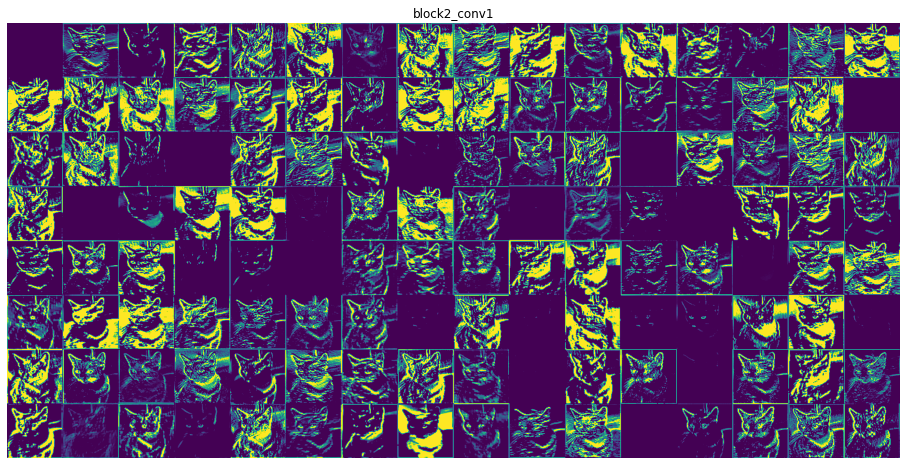

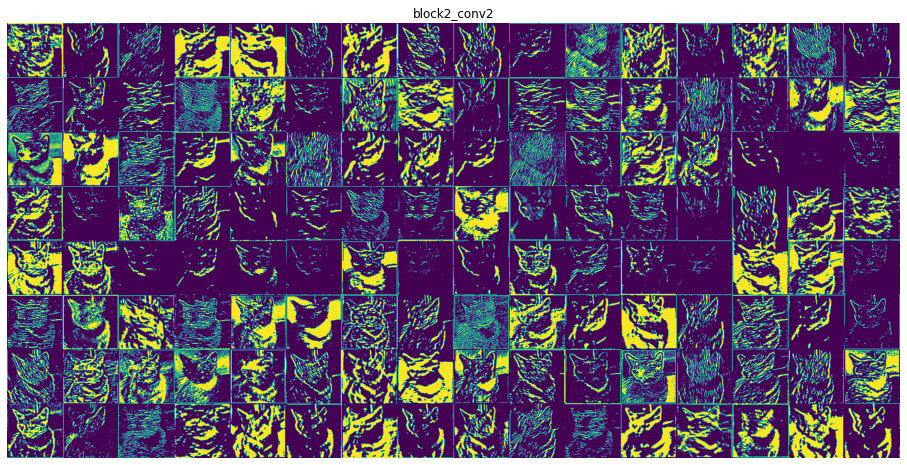

...

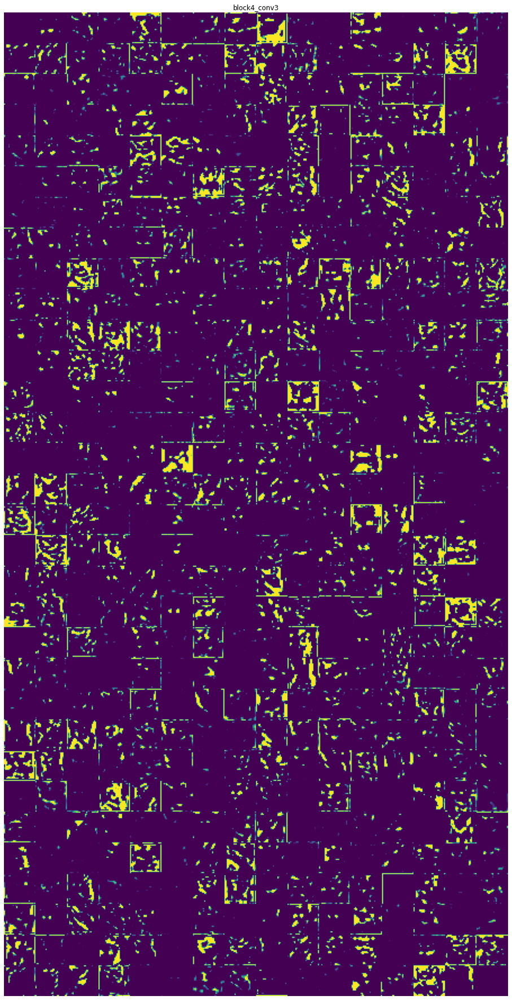

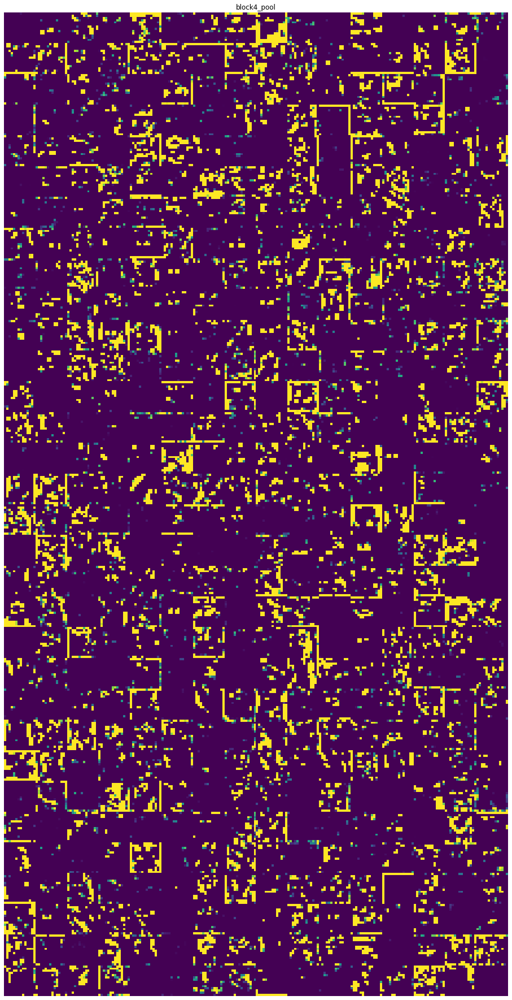

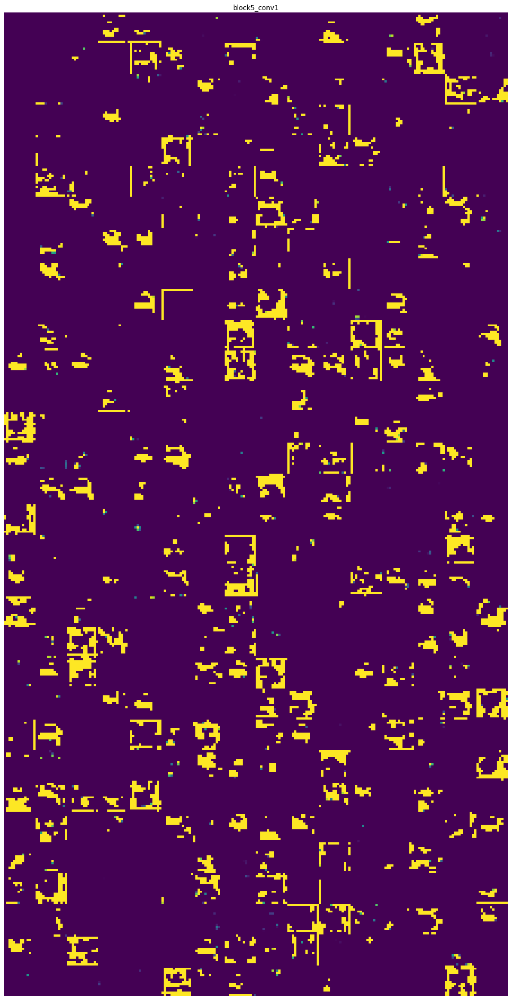

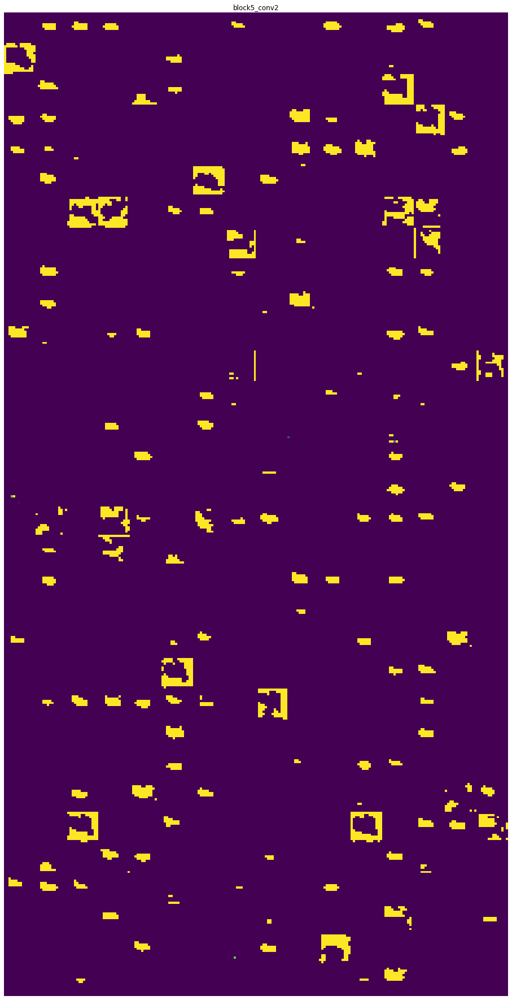

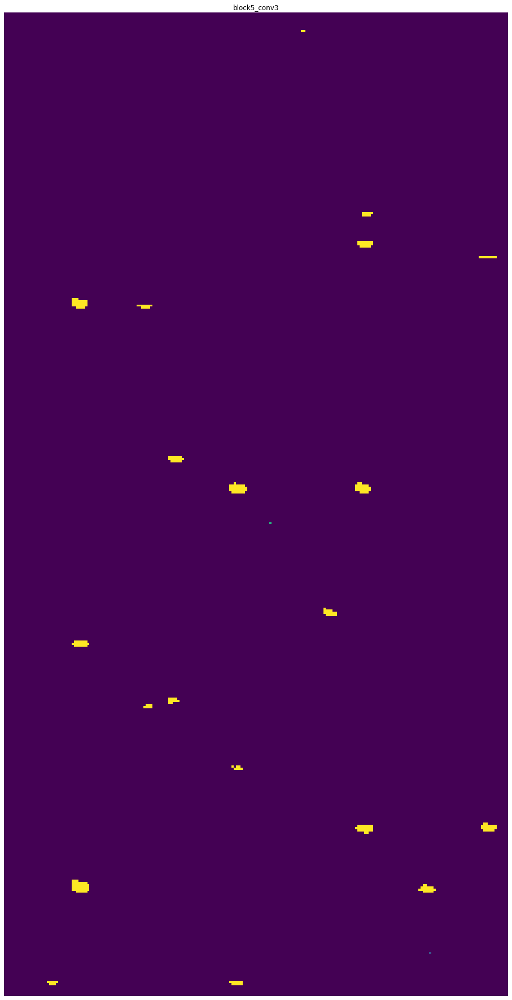

In [25]:

visualize_intermediate_activation(layer_names, activations)